<a href="https://colab.research.google.com/github/hri-ddo/Dog-vission/blob/main/Dog_vission.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#🐶 End to end Multi-class dog Breed classification

##Problem
Identifying the breed of a dog given by an image
## Data
The data we are using is from kaggle's dog breed identification compe
## Evaluation
The evaluation is a file is probabilitis of each dog
## Features
some information about the data
* we are dealing with images (unstructured data) -> deep learning
* 120 breeds of dogs (diffrend classes)
* there are around 10,000+ images in the training set with labels
* There are around 10,000+ test images without labels


## Getting our workspace ready

* import TensorFlow ✅
* import tensorFlowHub
* Make sure we're using a gpu


In [ ]:
#importing necessary tools

import tensorflow as tf
import tensorflow_hub as hub


TF version: 2.15.0
Tf Hub version 2.15.0
GPU available(YESSS!!!)


In [ ]:
 !unzip "/content/drive/MyDrive/dog-breed-identification.zip"

Archive:  /content/drive/MyDrive/dog-breed-identification.zip
replace labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Getting our data ready (turning inti tensors)


In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

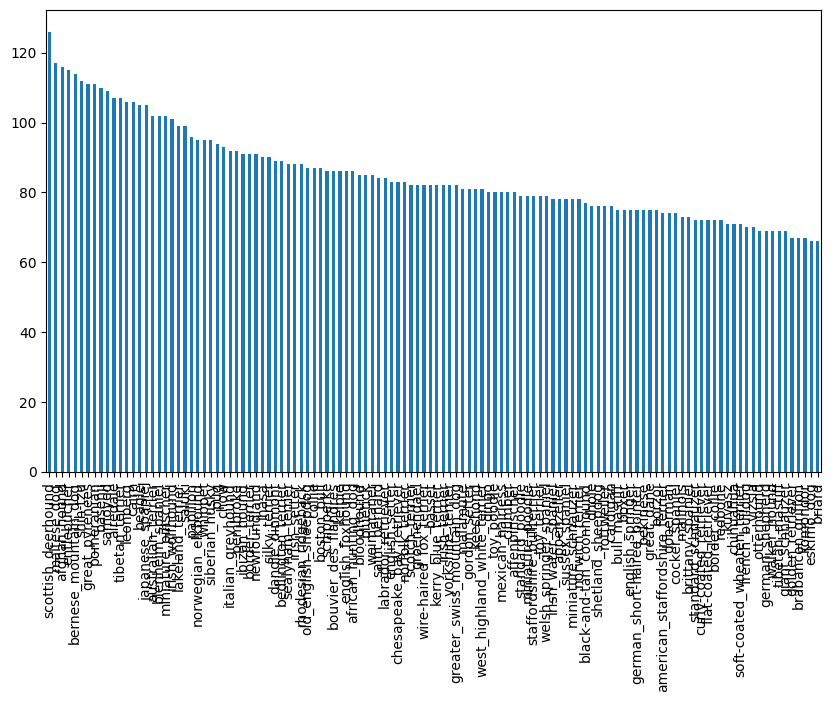

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(10,6))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
from IPython.display import Image

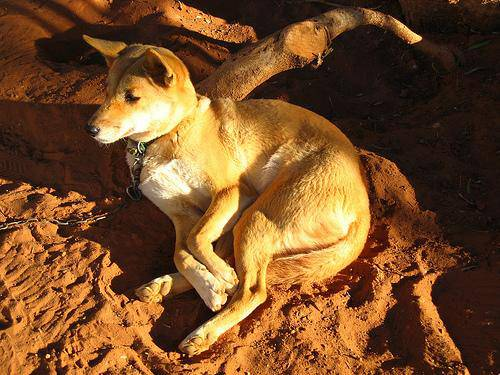

In [ ]:
Image("train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

image and path names

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames=["train/"+fname+".jpg" for fname in labels_csv["id"]]

In [ ]:
filenames[:2]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

In [ ]:
import os
if len(os.listdir("train/"))==len(filenames):
  print("Matched")

Matched


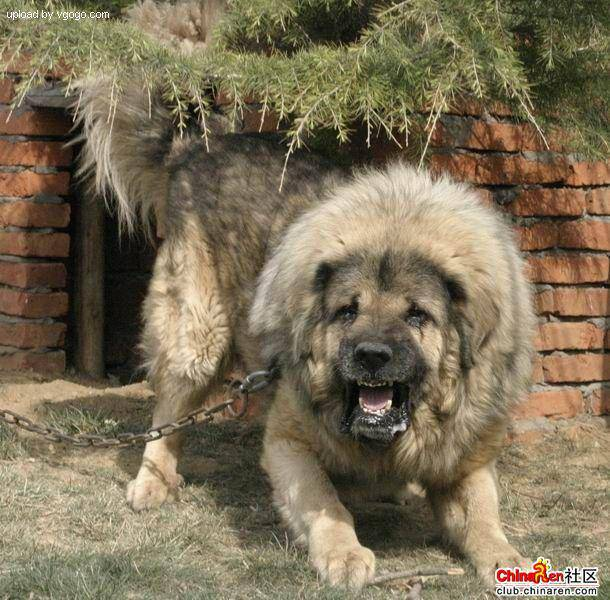

In [ ]:
 Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels =np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels =np.array(labels)
unique_breeds=np.unique(labels)


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Creating our own validation set


In [ ]:
X=filenames
y= boolean_labels


In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000,step:10}

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2],y_train[:2]

(['train/00bee065dcec471f26394855c5c2f3de.jpg',
  'train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Converting images into numbers

---
* Take an image filepath as input
* use Tensorflow to read the file and save it to a variable, `image`
* Turn our `image` into tensors
* resize the `image` to be a shape of (224,224)
* Return the modified   `image`


In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

# function to preprocess

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

why turn our data into batches?

whole data will not fit into memory

In orer to use TensorFlow effectively, we need our data in the form of tensor tuples which look like this:
`(images, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

Now we've got a wat to turn our data into tuples of Tensors in the form :`(image,label)`, make a function that trurn our data(`x` & `y`) into batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  plt.figure(figsize=(10,10))

  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels=next(train_data.as_numpy_iterator())

In [ ]:
len(train_images)

32

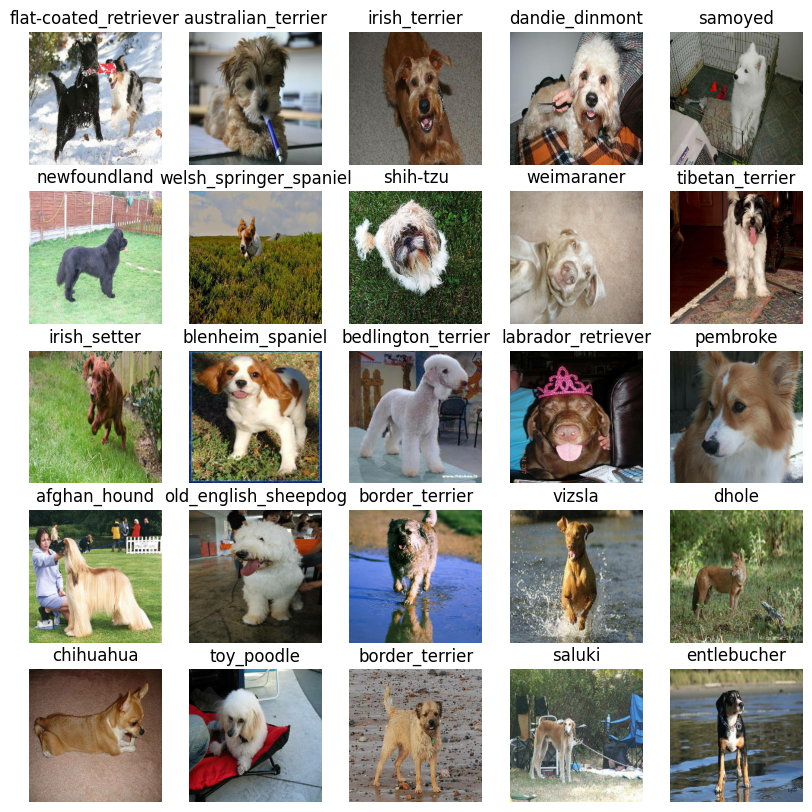

In [ ]:
show_25_images(train_images,train_labels)

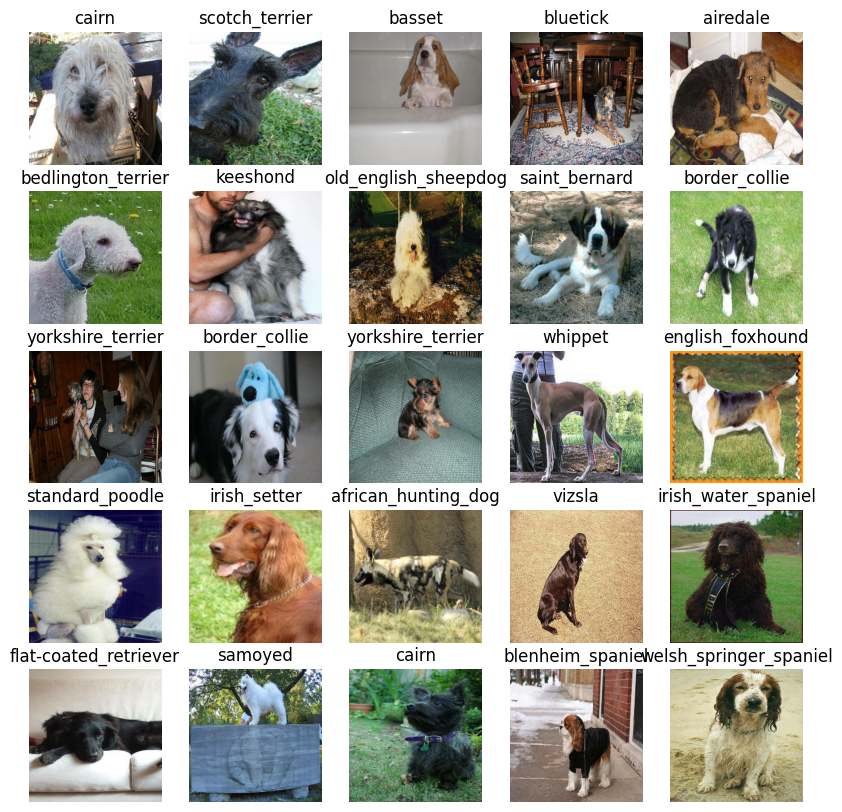

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Building a model

* The input shape (tesnsors)
* The output shape (tensors)
* The URL of the model we want


In [ ]:
# setup input shape to the model

INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)

#setup model URL from TensorFlow HUB
MODEL_URL ="https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

Now we've got our inputs, outputs and model ready to go Let's put them together into a keras deep learning model !
Knowing this, let;s create a function which:
* Takes the input shape , output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fasion
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model



In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating Callbacks

1. TensorBoard ->to track model progress
2. Early stopping

### TensorBoard callback
To setup a tensorBoard call back , we need to do 3 things:
1. Load Tensorboard notebook extension ✅
2. Create a tensorBoard callback which is able to save logs to a dicrectory and pass it to our model's `fit()` funtion.✅
3.Visualize our models traing logs with the `%tensorboard` magic function

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing Tensorboard logs
  logdir=os.path.join("/content/drive/MyDrive/Colab Notebooks/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping call back

In [ ]:
#Create early stopping
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

#Training a model(on subset of data)

our first model is only going to train on 1000 images,to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}


In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","avalaible(Yesss)" if tf.config.list_physical_devices("GPU")else "not available :()")

GPU avalaible(Yesss)


Lets create simple function which trains a model.
* create a model using `create_model()`
* Setup a TensorBoard callback using `create_tesorboard_callback`
* Call the `fit()` with train,val, epochs to train for (`NUM_EPOCHS`)
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
model=train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 7s 98ms/step - loss: 4.5575 - accuracy: 0.1088 - val_loss: 3.3938 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 107ms/step - loss: 1.6348 - accuracy: 0.7000 - val_loss: 2.1348 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 3s 104ms/step - loss: 0.5842 - accuracy: 0.9262 - val_loss: 1.6464 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 2s 67ms/step - loss: 0.2615 - accuracy: 0.9887 - val_loss: 1.4582 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 2s 66ms/step - loss: 0.1506 - accuracy: 0.9937 - val_loss: 1.3832 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 2s 67ms/step - loss: 0.1034 - accuracy: 1.0000 - val_loss: 1.3445 - val_accuracy: 0.6350
Epoch 7

### Checking the TensorBoard logs

the tensorboard magic

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/logs

<IPython.core.display.Javascript object>

### Making and evauliting predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predixtions on the validation data (not used to traind on)

predictions =model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 68ms/step


array([[1.37635786e-03, 1.41829471e-04, 7.33116467e-04, ...,
        4.26279410e-04, 1.05021056e-04, 1.80519409e-02],
       [1.83514203e-03, 3.43258609e-04, 4.48745117e-03, ...,
        6.91645604e-04, 6.43200707e-04, 2.03411517e-04],
       [1.34526517e-05, 1.08158558e-04, 3.67061075e-05, ...,
        2.76078004e-04, 7.93939253e-05, 2.88963522e-04],
       ...,
       [2.20294733e-05, 4.63002179e-05, 9.73537026e-05, ...,
        1.29974944e-06, 1.18849348e-04, 5.95898109e-06],
       [3.55606596e-03, 7.72698477e-05, 4.43746860e-04, ...,
        4.44245699e-04, 1.54550889e-05, 1.03702303e-02],
       [5.09760284e-05, 3.09464631e-05, 9.23330954e-04, ...,
        2.44735461e-03, 1.88857364e-03, 5.25189971e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.37635786e-03, 1.41829471e-04, 7.33116467e-04, 1.10610068e-04,
       3.59404949e-04, 3.72748145e-05, 4.80879135e-02, 2.46028329e-04,
       2.23009934e-04, 3.52055533e-04, 3.02349421e-04, 1.69780193e-04,
       4.40155673e-05, 8.13289953e-05, 3.05742375e-03, 7.49524101e-04,
       7.66913363e-05, 1.37308031e-01, 1.95712782e-05, 1.72171684e-04,
       4.50365106e-03, 4.90637758e-05, 3.27368361e-05, 9.92149697e-04,
       6.96626303e-05, 1.67128368e-04, 1.49872884e-01, 8.42302397e-05,
       6.39437989e-04, 3.94486007e-04, 4.73653257e-04, 1.89927325e-03,
       2.42832029e-04, 1.26103405e-04, 8.25283234e-04, 4.87512238e-02,
       1.15384246e-05, 1.74752437e-04, 1.21943602e-04, 2.19319365e-04,
       1.64177967e-03, 1.27615305e-04, 1.79309154e-05, 3.10221440e-05,
       3.62920873e-05, 2.08697427e-04, 2.14845168e-05, 2.62845482e-04,
       1.67863094e-04, 4.38980816e-04, 2.10100392e-04, 2.74451213e-05,
       8.95282195e-04, 4.44148391e-05, 4.30049695e-04, 4.71173989e-05,
      

In [ ]:
unique_breeds[11]

'bernese_mountain_dog'

In [ ]:
index=0
print(predictions[index])
print(f"Max valur (probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[1.37635786e-03 1.41829471e-04 7.33116467e-04 1.10610068e-04
 3.59404949e-04 3.72748145e-05 4.80879135e-02 2.46028329e-04
 2.23009934e-04 3.52055533e-04 3.02349421e-04 1.69780193e-04
 4.40155673e-05 8.13289953e-05 3.05742375e-03 7.49524101e-04
 7.66913363e-05 1.37308031e-01 1.95712782e-05 1.72171684e-04
 4.50365106e-03 4.90637758e-05 3.27368361e-05 9.92149697e-04
 6.96626303e-05 1.67128368e-04 1.49872884e-01 8.42302397e-05
 6.39437989e-04 3.94486007e-04 4.73653257e-04 1.89927325e-03
 2.42832029e-04 1.26103405e-04 8.25283234e-04 4.87512238e-02
 1.15384246e-05 1.74752437e-04 1.21943602e-04 2.19319365e-04
 1.64177967e-03 1.27615305e-04 1.79309154e-05 3.10221440e-05
 3.62920873e-05 2.08697427e-04 2.14845168e-05 2.62845482e-04
 1.67863094e-04 4.38980816e-04 2.10100392e-04 2.74451213e-05
 8.95282195e-04 4.44148391e-05 4.30049695e-04 4.71173989e-05
 8.23345763e-05 1.43228821e-03 5.39757661e-04 1.00081906e-01
 1.97332958e-03 1.07248467e-04 6.10960275e-03 5.09401980e-05
 1.99455419e-04 6.193752

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is grate but we want to be able to do it at scale
adn it would be even better if we could see the image the prediction is being made on!

**NOTE:** predictions probabilities are known as confidence levels

In [ ]:
# Turn prediction probabilities into there respective lebel (easier to understand)
def get_pred_label(prediction_probabities):
  return unique_breeds[np.argmax(prediction_probabities)]

pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

Now sicnce our validation data is still in a batch dataseet
we'll have to unvatchify it to make predictiins on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
def unbatchify(val_data):
  images_=[]
  labels_=[]

  #loop through unbatch data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_
val_images,val_labels=unbatchify(val_data)

In [ ]:
get_pred_label(val_labels[43])

'affenpinscher'

In [ ]:
get_pred_label(predictions[43])

'collie'

Let's make it vusual. We'll create a function which
* takes an array of truth labels and an array of images and intefers.
* Convert the prediction probabilities to a predicted label.
* Plot the predictied label, it's predicted label and the target image on single plot

In [ ]:
def plot_pred(prediction_probabities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  #plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Chage the pred lebel color if gree for true else red for false
  if pred_label == true_label:
    color ="green"
  else:
    color = "red"

  #Change the plot title to be predicted
  plt.title("Predicted label= {}\n {:2.0f}% \n Real label={}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)


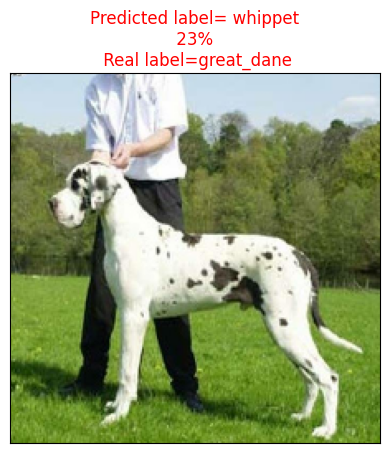

In [ ]:
plot_pred(prediction_probabities=predictions,
          labels=val_labels,
          images=val_images,n=99)

### top 10 prediction

In [ ]:
def plot_pred_conf(prediction_probabities,labels,n=1):
  pred_prob,true_label=prediction_probabities[n],labels[n]

  pred_label=get_pred_label(pred_prob)

  #Find the top 10 predicted indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  #Find the top 10 predicted values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

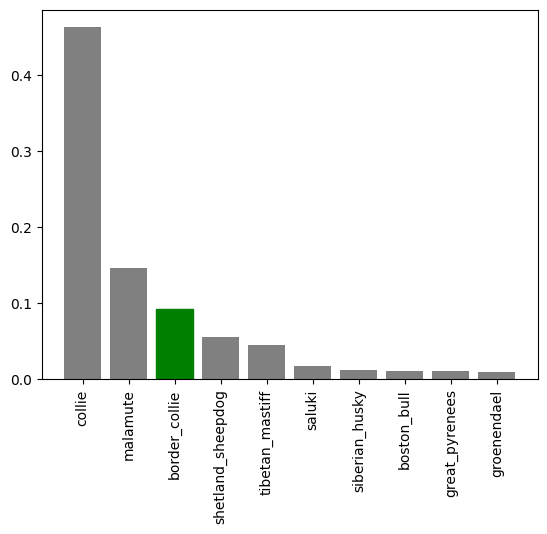

In [ ]:
plot_pred_conf(prediction_probabities=predictions,labels=val_labels,n=9)

Now we've got some function to help us to evaluate our model,let's check out a few

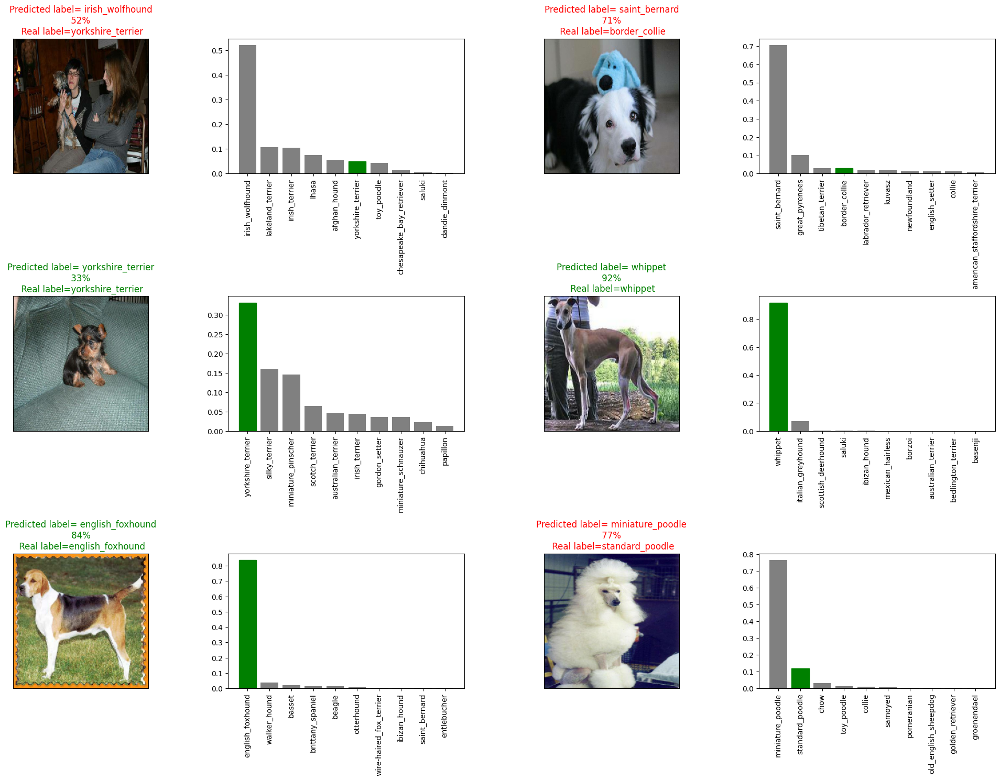

In [ ]:
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabities=predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  # Create a model directory pathname with current time
  modeldir=os.path.join("/content/drive/MyDrive/Colab Notebooks/Models",datetime.datetime.now().strftime("%Y%m%d=%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  print(f"Loadind saved model from:{model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetV2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/Models/20240201=08321706776352-1000-images-mobilenetV2-Adam.h5'

In [ ]:
#Load a traind model
loaded_1000_model=load_model("/content/drive/MyDrive/Colab Notebooks/Models/20240131=18051706724315-1000-images-mobilenetV2-Adam.h5")

Loadind saved model from:/content/drive/MyDrive/Colab Notebooks/Models/20240131=18051706724315-1000-images-mobilenetV2-Adam.h5


In [ ]:
# Evaluate the pre_saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 68ms/step - loss: 1.2192 - accuracy: 0.6650


[1.2192341089248657, 0.6650000214576721]

### Training a big dog model🐶 (on full data)


In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
X[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()

#No validation set when traing on all the data , so we can't monitor validation accuracy
full_model_eary_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

In [ ]:
#fit the model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_eary_stopping])

Epoch 1/100
320/320 [==============================] - 29s 73ms/step - loss: 1.3498 - accuracy: 0.6715
Epoch 2/100
320/320 [==============================] - 20s 63ms/step - loss: 0.4031 - accuracy: 0.8791
Epoch 3/100
320/320 [==============================] - 20s 63ms/step - loss: 0.2383 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 20s 63ms/step - loss: 0.1513 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 20s 62ms/step - loss: 0.1069 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 22s 69ms/step - loss: 0.0786 - accuracy: 0.9853
Epoch 7/100
320/320 [==============================] - 20s 63ms/step - loss: 0.0593 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 20s 63ms/step - loss: 0.0463 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 21s 64ms/step - loss: 0.0374 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 20s 64ms/step - l

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam2")

'/content/drive/MyDrive/Colab Notebooks/Models/20240201=08411706776904-full-image-set-mobilenetv2-Adam2.h5'

In [ ]:
loaded_full_model=load_model("/content/drive/MyDrive/Colab Notebooks/Models/20240201=05281706765285-full-image-set-mobilenetv2-Adam2.h5")

Loadind saved model from:/content/drive/MyDrive/Colab Notebooks/Models/20240201=05281706765285-full-image-set-mobilenetv2-Adam2.h5


In [ ]:
len(X)

10222

### Making prediction on the test dataset

we have to make our test files into the same shape of the model is trained on

Luckily we created `create_data_batches()`
* Get the test image filenames✅
* Convert the filenames into test data batches using and seting the `test_data` parameter to `True`✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model


In [ ]:
# Load test image filenames
import os
test_path= "/content/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

NameError: name 'os' is not defined

In [ ]:
len(test_filenames)

10357

In [ ]:
#test_data = tf.data.Dataset.from_tensor_slices(test_filenames)

In [ ]:
# Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predict()` will take time

In [ ]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 26s 81ms/step


In [ ]:
test_predictions[:10]

array([[1.7057979e-10, 9.6159674e-08, 1.5552075e-09, ..., 1.4207305e-07,
        6.0011079e-11, 2.4679142e-11],
       [9.4546824e-09, 4.6193338e-14, 2.7243416e-12, ..., 6.2628853e-09,
        1.7239987e-08, 7.7101978e-09],
       [1.8307005e-10, 7.5051947e-09, 2.9514691e-09, ..., 4.2220126e-06,
        2.6101827e-09, 4.5175197e-11],
       ...,
       [2.9557117e-11, 2.2581682e-10, 6.4348982e-10, ..., 9.9351927e-10,
        4.1813469e-06, 1.6182623e-11],
       [1.4826312e-12, 4.4183879e-13, 4.2609267e-11, ..., 1.0742672e-08,
        3.9477762e-08, 2.0504877e-11],
       [2.4525590e-09, 9.3960617e-09, 6.1660286e-12, ..., 1.8460188e-11,
        4.5612483e-09, 1.7900048e-07]], dtype=float32)

In [ ]:
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Test-solv/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions=np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Test-solv/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.70579786e-10, 9.61596740e-08, 1.55520752e-09, ...,
        1.42073048e-07, 6.00110794e-11, 2.46791424e-11],
       [9.45468237e-09, 4.61933382e-14, 2.72434159e-12, ...,
        6.26288532e-09, 1.72399872e-08, 7.71019781e-09],
       [1.83070045e-10, 7.50519469e-09, 2.95146907e-09, ...,
        4.22201265e-06, 2.61018274e-09, 4.51751969e-11],
       ...,
       [2.95571172e-11, 2.25816824e-10, 6.43489817e-10, ...,
        9.93519267e-10, 4.18134687e-06, 1.61826230e-11],
       [1.48263118e-12, 4.41838786e-13, 4.26092668e-11, ...,
        1.07426716e-08, 3.94777615e-08, 2.05048773e-11],
       [2.45255904e-09, 9.39606171e-09, 6.16602863e-12, ...,
        1.84601882e-11, 4.56124827e-09, 1.79000480e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing our output for kaggle
### sample submission www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
* create a id column and add data to each oof the dog breed columns
*Export the dataframe as a CSV to submit it to kaggle

In [ ]:
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['/content/test/c22c96451b2bb39cb7973fbda2eaefea.jpg',
 '/content/test/72948bdc296b5c5fe76637931f03a5ab.jpg',
 '/content/test/a8f3055821c65b70e67911cc5bad1270.jpg',
 '/content/test/33d92aec747f4d1b241553689f3f399a.jpg',
 '/content/test/d4f769129f9c415999dc400545af6053.jpg',
 '/content/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 '/content/test/5595e23287c1c0f8b1918dde99f3a6b0.jpg',
 '/content/test/af237c14d331689884a59904f1251983.jpg',
 '/content/test/c05b086e146ba9f803148e5081c4b889.jpg',
 '/content/test/6bf66427a5b217baec5728b1c3845e24.jpg',
 '/content/test/f202ad1aaf619f90386d96f5b874eeef.jpg',
 '/content/test/2e71f98fa641e76bcb34cb12dbd1a0f2.jpg',
 '/content/test/14495a39476bf7fb3ef0971c1edd76cb.jpg',
 '/content/test/2d3818c59288cd71e8a20e232048571d.jpg',
 '/content/test/307fa412bf933f52d78d147ba180e441.jpg',
 '/content/test/bfa4e738355858e51c3c690cd6306444.jpg',
 '/content/test/0de953decddc94fe55b0edfdee1936d4.jpg',
 '/content/test/6b6824bfade1e9501e048787d27e35fe.jpg',
 '/content

In [ ]:
# Append test image file ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c22c96451b2bb39cb7973fbda2eaefea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,72948bdc296b5c5fe76637931f03a5ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a8f3055821c65b70e67911cc5bad1270,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,33d92aec747f4d1b241553689f3f399a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d4f769129f9c415999dc400545af6053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c22c96451b2bb39cb7973fbda2eaefea,1.705798e-10,9.615967e-08,1.555208e-09,1.120223e-10,3.414877e-11,5.857468e-10,3.719120e-12,1.361816e-09,1.913438e-09,...,2.591967e-11,1.047857e-10,2.157023e-12,9.463948e-11,2.869631e-11,1.041675e-08,6.075424e-12,1.420730e-07,6.001108e-11,2.467914e-11
1,72948bdc296b5c5fe76637931f03a5ab,9.454682e-09,4.619334e-14,2.724342e-12,3.972251e-11,1.130479e-08,2.956017e-11,4.805212e-12,1.656684e-10,2.875805e-12,...,6.305171e-09,1.860314e-07,1.593135e-10,2.905478e-12,2.255770e-11,1.101490e-12,1.509453e-09,6.262885e-09,1.723999e-08,7.710198e-09
2,a8f3055821c65b70e67911cc5bad1270,1.830700e-10,7.505195e-09,2.951469e-09,1.389761e-08,5.934795e-03,6.163622e-07,9.762339e-11,6.554628e-10,2.272768e-09,...,2.803648e-08,3.137014e-09,3.459334e-06,2.144733e-08,1.293567e-03,4.172337e-11,3.347337e-09,4.222013e-06,2.610183e-09,4.517520e-11
3,33d92aec747f4d1b241553689f3f399a,9.120360e-11,4.758785e-08,9.938810e-10,8.204869e-11,1.304232e-07,1.628330e-06,4.012310e-11,3.337310e-11,1.893839e-11,...,5.738159e-10,2.408612e-10,2.392151e-08,3.031066e-04,2.506603e-07,5.585114e-08,2.636427e-10,5.225506e-06,3.721392e-10,8.190453e-11
4,d4f769129f9c415999dc400545af6053,1.335171e-09,1.794707e-09,2.512467e-10,4.753368e-14,5.000834e-09,1.646000e-11,2.874329e-13,1.926889e-11,1.054463e-11,...,5.553536e-12,1.252502e-08,6.362315e-09,6.539804e-06,4.447820e-08,6.317202e-12,1.004188e-07,9.837719e-08,1.741297e-11,9.416540e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,9ae64eb724d302df9b59eae70864962a,1.121909e-08,1.170747e-08,8.694833e-03,6.990041e-04,3.580674e-07,4.004955e-05,2.819404e-06,8.004806e-05,3.199993e-04,...,2.906545e-07,3.218311e-09,2.781338e-07,5.925247e-04,7.813273e-06,1.697724e-02,1.310438e-06,2.587014e-04,4.744846e-04,1.045462e-09
10353,ecb6362d105c0cb84d8e69cfd9b8d0b5,2.042018e-09,6.018931e-12,1.558532e-11,7.601386e-13,1.393772e-08,1.920152e-11,5.451115e-10,2.569456e-09,2.339476e-12,...,1.711391e-09,4.351673e-10,1.121030e-11,2.452741e-09,1.797854e-10,1.807182e-10,5.654225e-10,3.119981e-14,4.016501e-11,1.455409e-09
10354,e78d3997b4e7f4abc1299f81b8e3b2d9,6.617686e-08,6.881534e-14,3.694941e-09,8.605310e-13,1.182073e-10,2.030436e-11,2.663591e-08,3.086891e-09,3.305397e-12,...,1.691765e-08,7.871685e-07,1.583185e-12,2.140642e-10,4.677406e-12,1.674442e-12,1.980387e-09,1.689090e-10,3.952867e-12,1.355304e-08
10355,64288d8b9c08221f721d1edc26725c32,2.784617e-07,4.364043e-01,8.248415e-07,5.788715e-07,4.359316e-09,4.170591e-06,8.259143e-09,1.005632e-07,4.363133e-06,...,6.354735e-04,5.497027e-08,1.975276e-06,1.699244e-07,6.981928e-04,1.424888e-10,1.445131e-07,1.717496e-05,2.177437e-06,2.951014e-07


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Test-solv/full-model-solv.csv",index=False)

### Making prediction on custom images
to make predicitons on custom images
we'll:
* Get the file paths
* Turn the filepaths into data batches using `create_data_batches`, we set test_data paramiters `True`
* pass the custom image data batch to our model's `predict()` method
* Conver the prediction output probabilities

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from:{model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
def get_pred_label(prediction_probabities):
  return unique_breeds[np.argmax(prediction_probabities)]

In [ ]:
loaded_full_model=load_model("/content/drive/MyDrive/Colab Notebooks/Models/20240201=05281706765285-full-image-set-mobilenetv2-Adam2.h5")

Loading saved model from:/content/drive/MyDrive/Colab Notebooks/Models/20240201=05281706765285-full-image-set-mobilenetv2-Adam2.h5


In [ ]:
labels_csv=pd.read_csv("/content/drive/MyDrive/dog-breed-identification.zip (Unzipped Files)/labels.csv")
labels=labels_csv["breed"]
labels =np.array(labels)
unique_breeds=np.unique(labels)

In [ ]:

custom_path="/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/"
custom_path_images=[custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_path_images

['/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/20240117_162734.jpg',
 '/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/download.jpg',
 '/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/dog-1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/dog-2.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/Screenshot 2024-02-19 at 10.28.34\u202fPM.png',
 '/content/drive/MyDrive/Colab Notebooks/MyDogPhotos/dogy.jpg']

In [ ]:
#Turn images into batches

custom_data =create_data_batches(custom_path_images,test_data=True)


Creating test data batches...


In [ ]:
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 4s 4s/step


In [ ]:
custom_preds.shape

(6, 120)

In [ ]:
#Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['boxer',
 'brabancon_griffon',
 'german_shepherd',
 'doberman',
 'komondor',
 'yorkshire_terrier']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

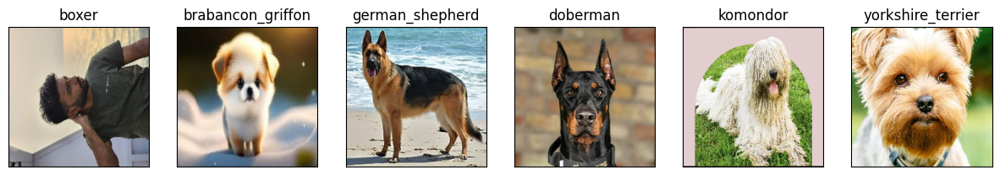

In [ ]:
# Check custom image predictions
plt.figure(figsize=(15, 15))
for i, image in enumerate(custom_images):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)